
<p style="text-align: center;">
  <img src="https://upload.wikimedia.org/wikipedia/fr/thumb/2/2c/Universit%C3%A9_Panth%C3%A9on-Sorbonne_%28depuis_janvier_2015%29.svg/1200px-Universit%C3%A9_Panth%C3%A9on-Sorbonne_%28depuis_janvier_2015%29.svg.png?20161020031138" alt="Description de l'image" style="width: 30%;"/>
</p>



<h1 style="text-align: center; color: #0c3c6c; font-size: 35px;">TP d'Apprentissage Statistique Avancé : Détection des changements de rupture

<h1 style="text-align: center; color: #0c3c6c; font-size: 20px;">Elodie HUTIN - Master 2 TIDE 

In [4]:
import ruptures as rpt
import matplotlib.pyplot as plt
import numpy as np
import librosa

# Exercice 1

## 1. Signal univarié :

(a). Utiliser la fonction pw_constant pour générer un signal réel constant par morceaux de
longueur n = 1000 avec K = 10 ruptures. Ce signal est stocké dans le vecteur $Y ∈ R_n$.

In [5]:
n = 1000  # Longueur du signal
K = 10    # Nombre de ruptures
y, bkps = rpt.pw_constant(n,n_bkps=K)

Nous avons généré un signal de taille n=1000, constant par morceaux avec 10 ruptures grâce à la fonction pw_constant.

(b). Vous prendrez également soin de récupérer les positions des K ruptures que vous stockerez dans le vecteur Bkps. Afficher la liste de ces points de ruptures

In [6]:
print("La liste des points de ruptures est:",bkps)

La liste des points de ruptures est: [96, 177, 270, 359, 447, 535, 625, 714, 820, 909, 1000]


(c). Afficher le signal généré à la question précédente à l’aide de la fonction display de la librairie ruptures

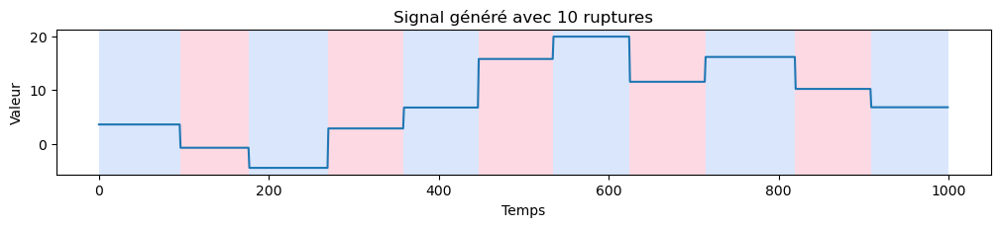

In [7]:
rpt.display(y,bkps)
plt.title('Signal généré avec {} ruptures'.format(K))
plt.xlabel('Temps');
plt.ylabel('Valeur');

Grâce à la fonction display de la librairies Ruptures, nous pouvons facilement visualiser le signal généré avec les 10 ruptures mises en évidence par une alternance de couleurs.

(d).Répéter cette expérience plusieurs fois et observer les différentes réalisations de votre signal. Pouvez-vous dire comment sont générées les amplitudes des ruptures ?

Signal 1
Positions des ruptures : [  91  177  267  351  437  526  619  709  810  908 1000]


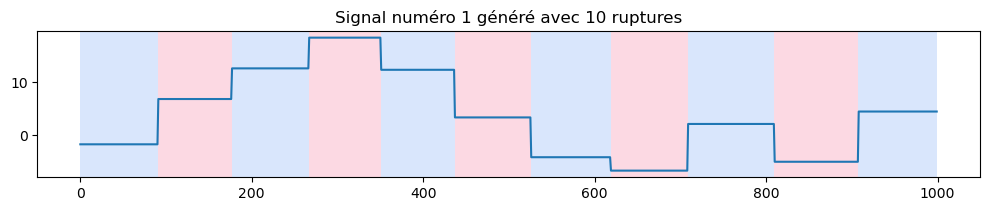

Signal 2
Positions des ruptures : [  90  171  263  357  452  554  637  732  828  918 1000]


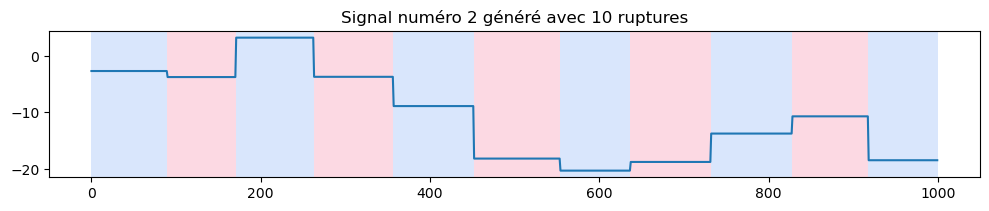

Signal 3
Positions des ruptures : [  85  173  262  343  443  533  626  719  813  912 1000]


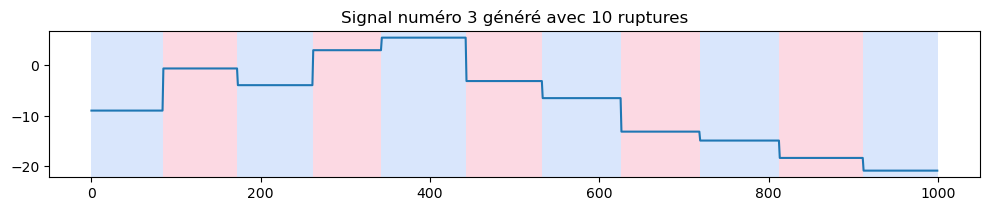

Signal 4
Positions des ruptures : [  87  172  262  352  451  539  632  729  825  913 1000]


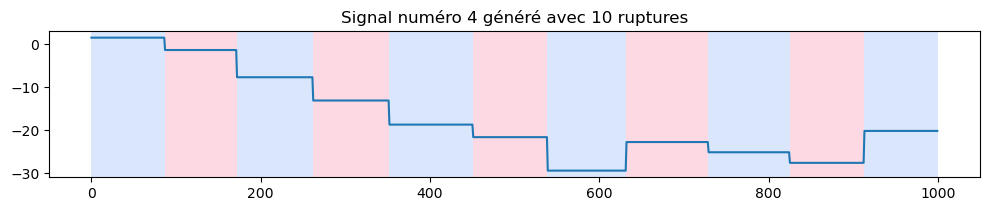

Signal 5
Positions des ruptures : [  93  182  278  376  465  549  643  723  818  901 1000]


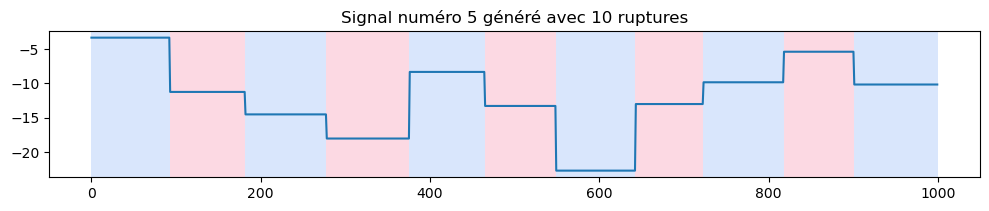

In [8]:
nb = 5
for i in range(nb):
    y, bkps = rpt.pw_constant(n,n_bkps=K)
    Bkps = np.array(bkps)
    print("Signal", i+1)
    print("Positions des ruptures :", Bkps)
    rpt.display(y, bkps)
    plt.title('Signal numéro {} généré avec {} ruptures'.format(i+1,K))
    plt.show()

Les graphiques produits ci-dessus représentent des signaux générés par la fonction pw_constant, sans aucun paramètre optionnel précisé. Ainsi les amplitudes des ruptures ont été générées de manière aléatoire, en utilisant une distribution normale. On observe ainsi différentes réalisations du signal, à chaque nouvelle exécution.

## 2. Régler les paramètres du signal :

(a). Trouver dans la notice comment régler l’amplitude δ des sauts, la variance σ
2 du bruit,et fixer la graine à l’aide du paramètre seed.

En parcourant la documentation, j'ai pu trouvé que l'amplitude δ des sauts peut être régler avec le paramètre delta. Un intervalle est fourni afin que l'amplitude moyenne du décalage soit tirée uniformément parmi cet intervalle.

De plus, le paramètre noise_std permet de contrôler l'écart-type du bruit ajouté au signal généré.

(b).Fixer $δ ∈ [1, 2]$ et $σ^2 = 1$ puis générer un signal réel comportant K = 5 ruptures que
vous afficherez pour une graine donnée.

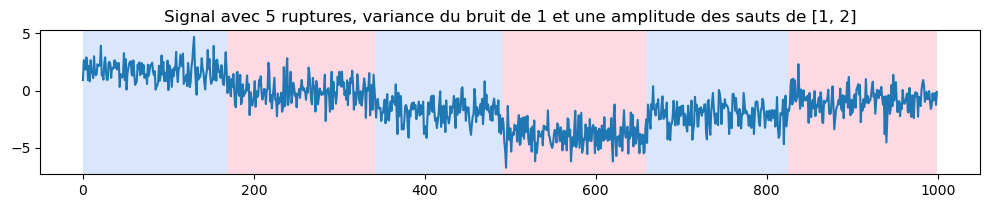

In [9]:
delta=[1,2]
sigma2 = 1
K = 5  # Nb de ruptures
y, bkps = rpt.pw_constant(1000, n_bkps=K, noise_std=np.sqrt(sigma2),delta=(1, 2),seed=42)
rpt.display(y, bkps)
plt.title('Signal avec {} ruptures, variance du bruit de {} et une amplitude des sauts de {}'.format(K,sigma2,delta));

(c). Comparer pour la même graine le signal généré précédemment avec celui obtenu pour $σ^2 = 4$. Que constatez-vous ?

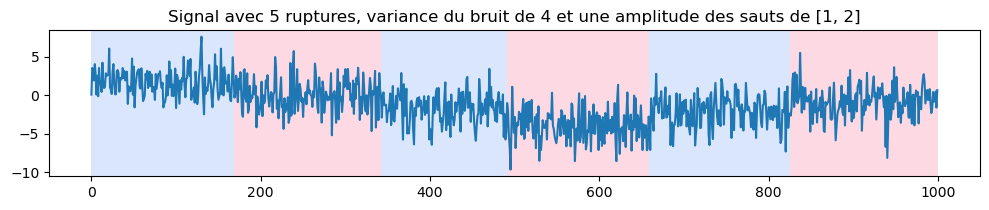

In [10]:
sigma2_c = 4
y, bkps = rpt.pw_constant(1000, n_bkps=K, noise_std=np.sqrt(sigma2_c),delta=(1, 2),seed=42)
rpt.display(y, bkps)
plt.title('Signal avec {} ruptures, variance du bruit de {} et une amplitude des sauts de {}'.format(K,sigma2_c,delta));

En examinant les deux graphiques ci-dessus, je peux observer que les signaux générés présentent une structure similaire, puisqu'ils sont caractérisés par le même nombre de ruptures et valeurs d'amplitudes (delta) identiques. Cependant, une différence notable s'observe dans l'amplitude du bruit ajouté à chaque signal.

Le premier signal, a une variance du bruit ($σ^2$) de 1, et présente donc un niveau de bruit relativement faible. En revanche, le deuxième signal a une variance du bruit augmentée à 4, et le niveau de bruit est donc plus élevé. Par conséquent, les fluctuations autour des points de rupture sont beaucoup plus importantes, ce qui se traduit par une courbe plus saccadée et irrégulière.

On remarque donc qu'en modifiant la valeur de la variance du bruit de 1 à 4, on a obtenu un second bruit avec un écart-type de bruit deux fois plus grand que par rapport au premier.

(d). Répéter l’expérience, toujours avec la même graine, pour une amplitude $δ ∈ [0.5, 1]$ et $σ^2 = 1$. Que conclure par comparaison avec le cadre précédent ?

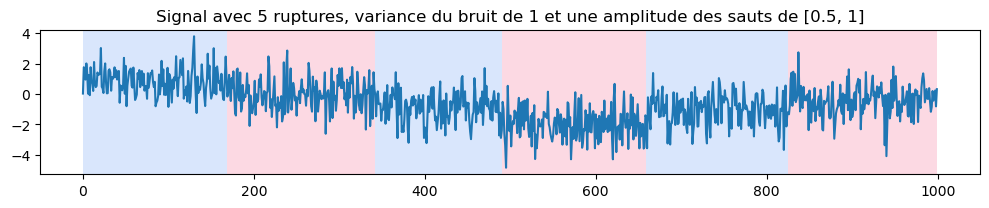

In [11]:
delta_d=[0.5,1]
sigma2_d = 1
y, bkps = rpt.pw_constant(1000, n_bkps=K, noise_std=np.sqrt(sigma2_d),delta=(0.5, 1),seed=42)
rpt.display(y, bkps)
plt.title('Signal avec {} ruptures, variance du bruit de {} et une amplitude des sauts de {}'.format(K,sigma2_d,delta_d));

En comparant les deux derniers signaux générés, je constate qu'ils ont une structure similaire, caractérisée par des ruptures présentes aux mêmes positions et des niveaux de bruit identiques, fixés à une variance de 1. Cependant, on peut remarquer une différence dans les échelles des variations temporelles entre les deux signaux. Le premier signal présente des variations temporelles plus amples (entre 1 et 2), tandis que le deuxième signal a des variations plus restreinte, avec des intervalles de rupture allant de 0.5 à 1. Cette différence impacte donc sur l'échelle des variations du signal.

## 3. Signal multivarié

(a). Générer et affichez un signal mutivarié avec 5 composantes p = 5 et 10 ruptures que vous
afficherez.

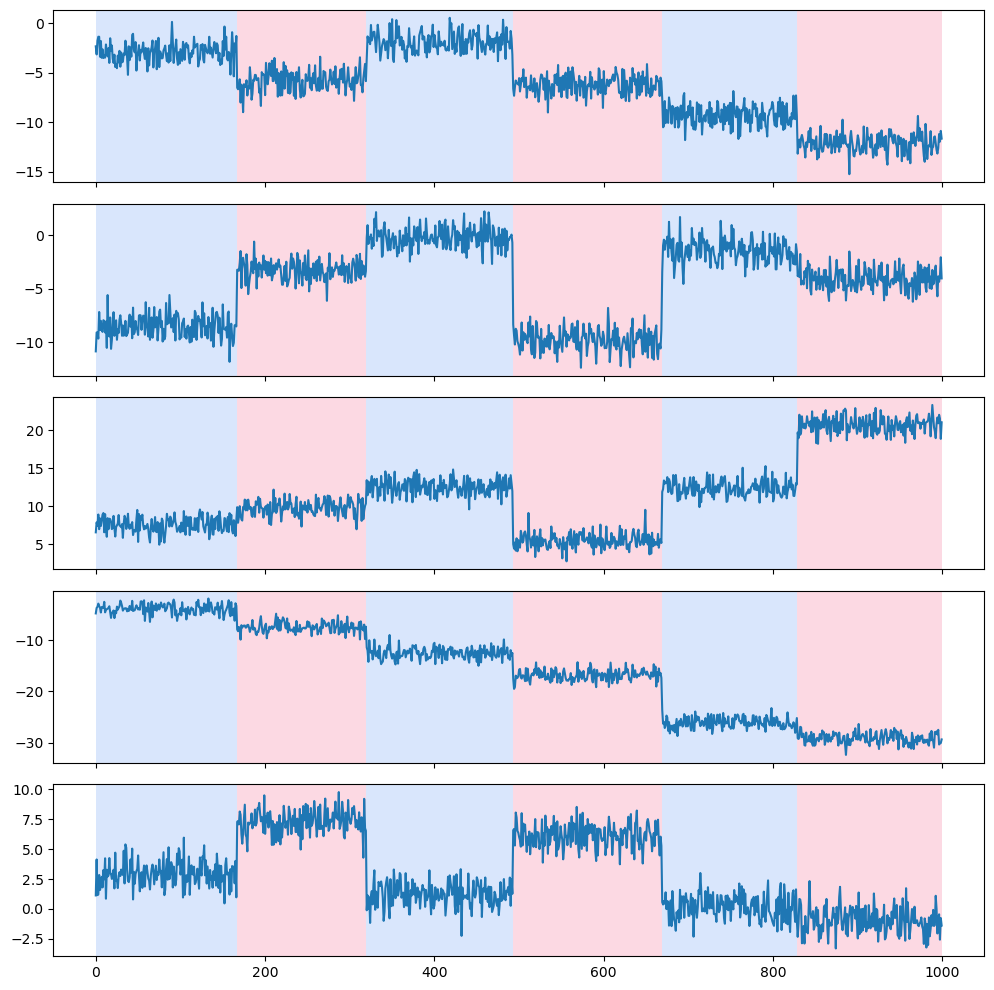

In [12]:
p=5
y_multivarie, bkps = rpt.pw_constant(n, n_features=p,n_bkps=K,noise_std=1)
rpt.display(y_multivarie,bkps);

Il est possible d'utiliser la fonction pw_constant pour génerer un signal multivarié, en définissant le paramètre n_features. Nous souhaitons avoir un signal à 5 composantes, ainsi nous avons défini n_features=5.


Après avoir répété l’expérience plusieurs fois, dites ce que vous remarquez
concernant les ruptures sur chaque composante ?

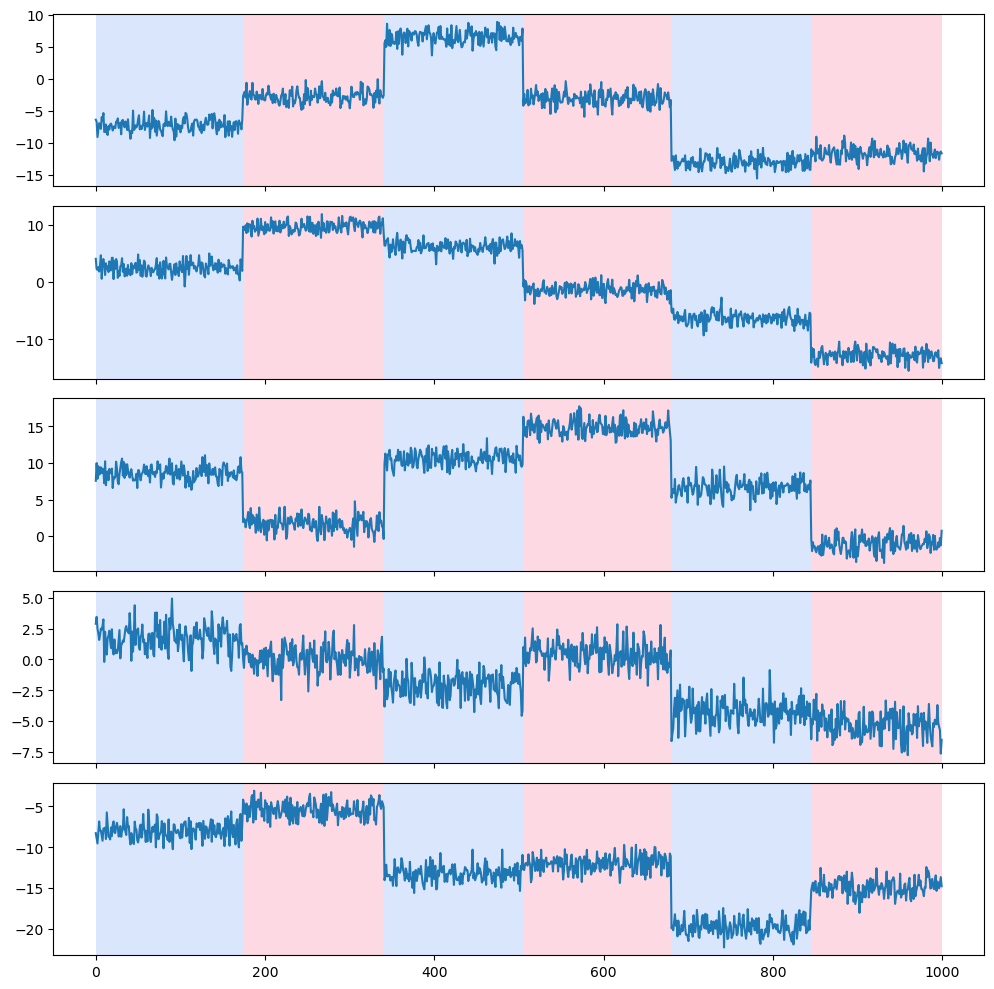

In [13]:
y_multivarie, bkps = rpt.pw_constant(n, n_features=p, n_bkps=K, noise_std=1)
rpt.display(y_multivarie, bkps);

On peut remarquer que les cinq composantes du signal présentent des positions de ruptures similaires, mais avec une amplitude bien différentes. CAprès avoir répété plusieurs fois l'expérience, ces amplitudes sont bien différentes pour chaque composante, générées de manière aléatoire puisque nous n'avons pas défini la valeur de delta. Les positions des ruptures ne semblent pas changer de position.  Certaines composantes présentent des changements brusques, tandis que d'autres restent plutôt stables.

(b). Expliquer comment vous pouvez générer un signal à 5 composantes de bruit pur de
variance 1. Tracer le graphique obtenu.

Pour générer un signal à 5 composantes de bruit pur de variance 1 on utilise la distribution normale. Pour chacune des composantes du signal, nous devons générer une série de n valeurs aléatoires tirées d'une distribution normale avec une moyenne de 0 et une variance de 1.

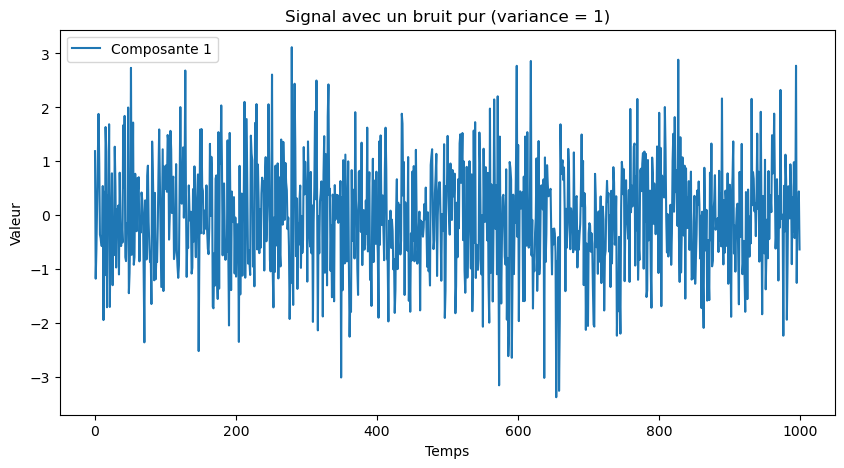

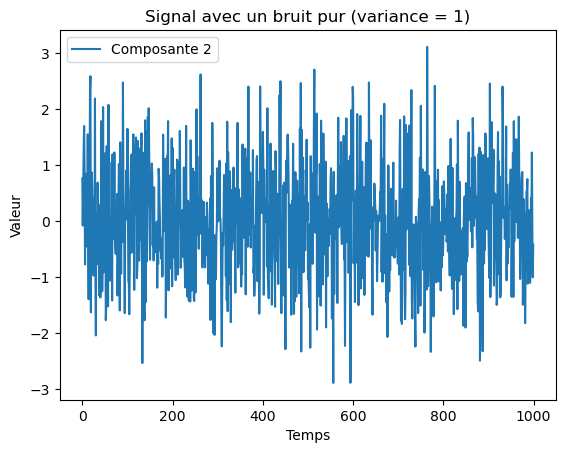

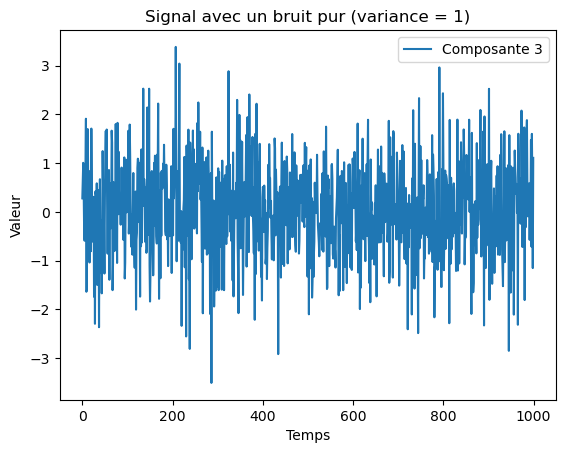

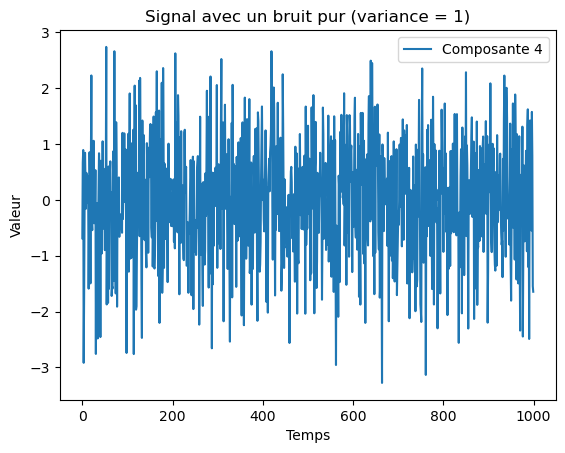

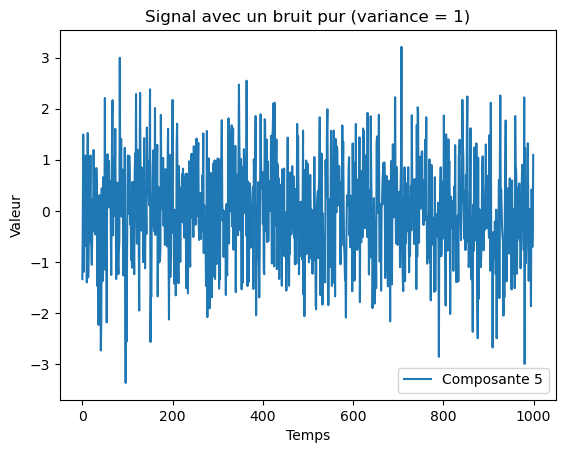

In [14]:
bruit_pur = np.random.normal(loc=0, scale=np.sqrt(1), size=(n, p))

plt.figure(figsize=(10, 5))
for i in range(p):
  plt.plot(bruit_pur[:, i], label='Composante {}'.format(i+1))
  plt.title('Signal avec un bruit pur (variance = 1)')
  plt.xlabel('Temps')
  plt.ylabel('Valeur')
  plt.legend()
  plt.show()

(c).Proposer à présent une statégie afin de générer un signal à p = 5 composantes dont seules
2 composantes portent des ruptures et les 3 autres ne sont qu’un bruit pur. Afficher le
signal obtenu.

Pour générer un signal à p = 5 composantes dont seules
2 composantes portent des ruptures et les 3 autres ne sont qu’un bruit pur, nous générerons les 3 bruits pur comme précédemment d'une part, et 2 composantes avec des ruptures grâce à la fonction pw_constant.


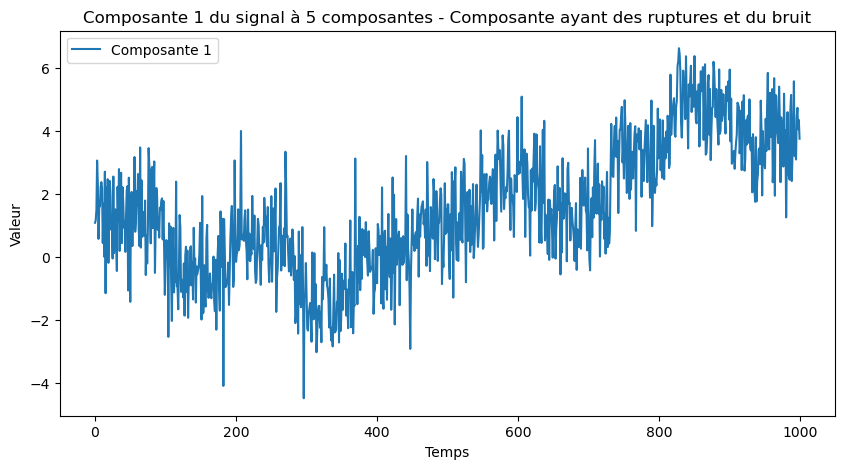

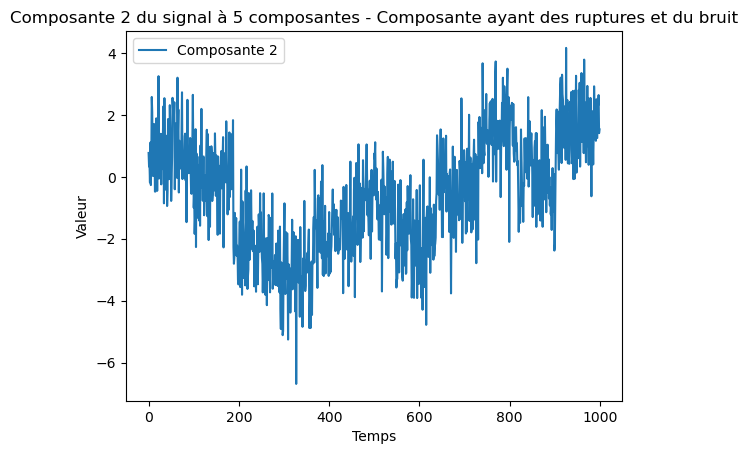

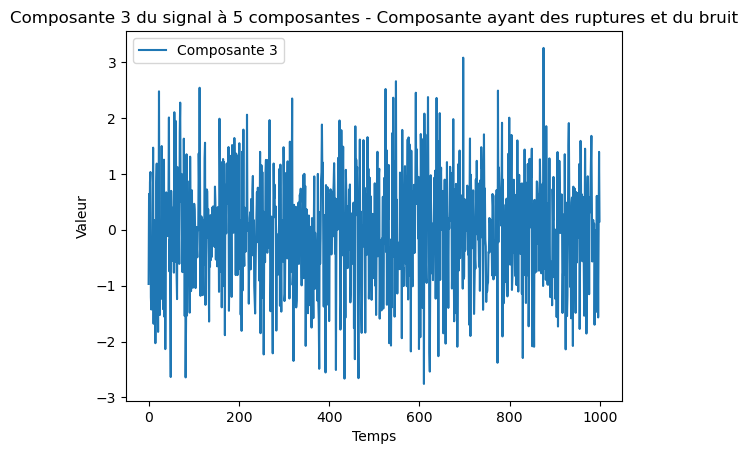

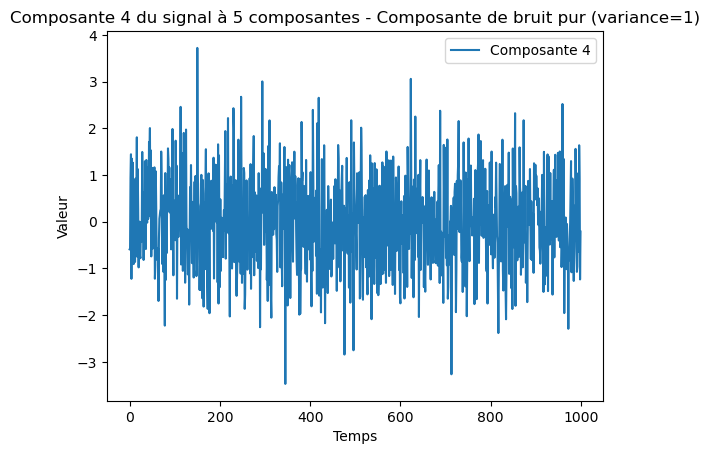

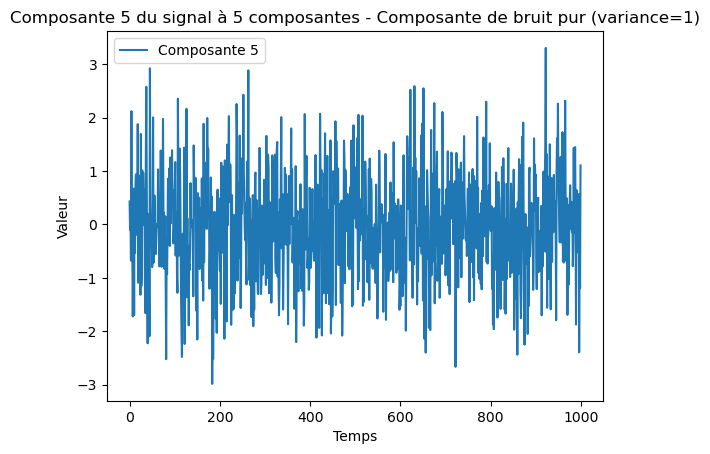

In [15]:
y, _ = rpt.pw_constant(n, n_features=2, n_bkps=10,noise_std=1,delta=(1,2))
noise = np.random.normal(loc=0, scale=np.sqrt(1), size=(n, 3))
signal_final = np.hstack((y, noise))

plt.figure(figsize=(10, 5))
for i in range(p):
  plt.plot(signal_final[:, i], label='Composante {}'.format(i+1))
  if i<3:
    plt.title('Composante {} du signal à 5 composantes - Composante ayant des ruptures et du bruit'.format(i+1))
  else:
    plt.title('Composante {} du signal à 5 composantes - Composante de bruit pur (variance=1)'.format(i+1))
  plt.xlabel('Temps')
  plt.ylabel('Valeur')
  plt.legend()
  plt.show()

# Exercice 2

On commence par générer un signal réel de longueur
n = 1000 et de variance 1, avec K = 30 ruptures d’amplitude 1.

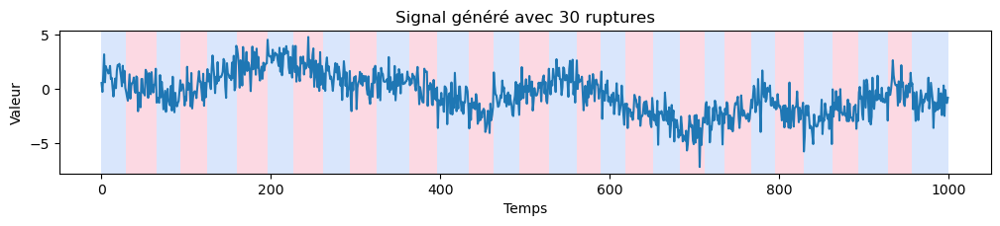

In [16]:
k=30
signal, bkps = rpt.pw_constant(n,n_bkps=k,noise_std=1,delta=(1,1))
rpt.display(signal,bkps)
plt.title('Signal généré avec {} ruptures'.format(k))
plt.xlabel('Temps');
plt.ylabel('Valeur');

1. Utiliser la fonction Dynp pour trouver la liste des 30 ruptures estimées.

In [17]:
algo = rpt.Dynp(model="l2", min_size=2).fit(signal)
estimated_bkps = algo.predict(n_bkps=k)
print("Les ruptures estimées ont les positions suivantes : ",estimated_bkps)

Les ruptures estimées ont les positions suivantes :  [30, 65, 90, 125, 160, 195, 220, 255, 290, 390, 425, 445, 460, 495, 530, 565, 600, 615, 645, 680, 710, 765, 780, 790, 800, 835, 850, 895, 930, 960, 1000]


Lorsque nous ne connaissons pas les positions des ruptures d'un signal, nous pouvons chercher à les estimer. Ainsi, pour trouver la meilleure segmentation, il est possible de calculer le LLR (Log Likelihood Ratio) de chacune des segmentations possibles, et de choisir celle qui le maximise. Cependant, ceci peut être très long et fastidieux en fonction de la taille du signal et du nombre de ruptures. Un algorithme dynamique, Dynp, a alors été developpé afin de résoudre ce problème : il calcule le coût de chaque segment du signal et retient la somme minimale des coûts des segments couvrant l'entiereté du signal .

$C(s, t) = \sum_{i \in ]s,t]} (X_i - \overline{X}_{s+1:t})^2$

2. Combien y a-t-il de segmentations à 30 ruptures ? Quel est alors l’ingrédient qui permet
de réaliser ce calcul ? La solution obtenue est-elle optimale ou correspond-ell plutôt à un
optimum local ?

Si un signal possède 30 ruptures, alors il présentera 31 segmentations, sur 30 points distincts.
Notre signal possède n=1000 observations, ainsi le nombre total de segmentation possible avec 30 ruptures, est donné par le nombre de façons de choisir le nombre de segmentations -1 parmi n-1 soit $\binom{n-1}{G-1}$, c'est-à-dire $\binom{999}{30}$, et a donc une compléxité exponentielle  (nombre très très grand).  

Pour trouver une segmentation optimale,  il serait long d'étudier manuellement toutes les configurations possibles. Une solution plus efficace consiste à utiliser à des algorithmes de programmation dynamique. La fonction Dynp de la bibliothèque Ruptures est spécialement conçue à cet effet. Elle calcule et optimise les coûts associés à différentes configurations de rupture, facilitant ainsi la recherche de la segmentation optimale. En utilisant des techniques de programmation dynamique, Dynp explore efficacement l'espace des solutions pour sélectionner la configuration de rupture minimisant le coût global, ce qui assure une segmentation précise et efficace du signal.

Bien que la fonction Dynp fournisse une liste des ruptures estimées, la solution obtenue n'est pas nécessairement optimale. Utilisant la programmation dynamique, Dynp calcule les points de changement optimaux pour un modèle de segmentation donné, minimisant ainsi la somme des erreurs. Cependant, elle peut ne pas garantir la solution optimale et peut plutôt trouver un optimum local qui minimise la pénalité définie. Pour obtenir une solution optimale, l'exploration de toutes les combinaisons possibles serait nécessaire, ce qui peut s'avérer prohibitif en termes de temps de calcul pour de grands ensembles de données.



3. Utiliser la fonction display pour afficher les ruptures estimées.

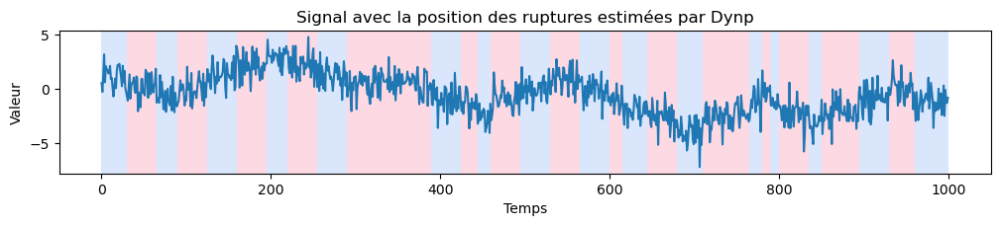

In [18]:
rpt.display(signal, estimated_bkps)
plt.title('Signal avec la position des ruptures estimées par Dynp')
plt.xlabel('Temps');
plt.ylabel('Valeur');

4. Explorer l’influence des paramètres min_size et jump.

 a. Reproduire les expériences précédentes avec min_size∈ {1, 10, 20, 40}

[30, 65, 90, 125, 160, 195, 220, 255, 290, 390, 425, 445, 460, 495, 530, 565, 600, 615, 645, 680, 710, 765, 780, 790, 800, 835, 850, 895, 930, 960, 1000]
[30, 65, 90, 125, 160, 195, 220, 255, 290, 390, 425, 445, 460, 495, 530, 565, 600, 615, 645, 680, 710, 765, 780, 790, 800, 835, 850, 895, 930, 960, 1000]
[30, 65, 90, 125, 160, 195, 220, 255, 290, 320, 375, 395, 435, 460, 495, 530, 565, 590, 615, 645, 680, 710, 750, 770, 800, 835, 860, 895, 930, 960, 1000]


BadSegmentationParameters: 

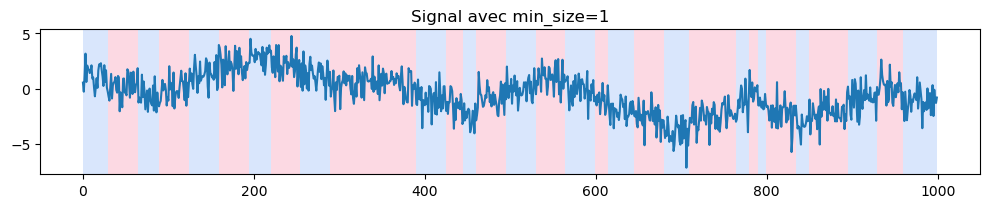

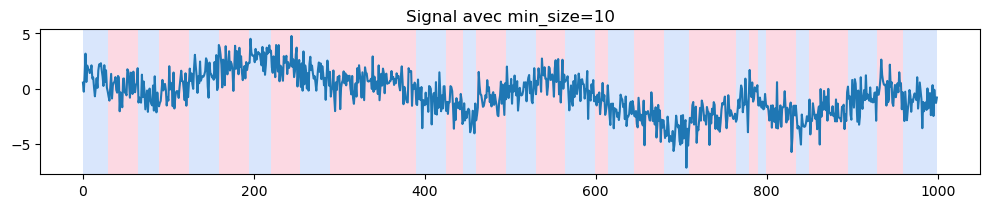

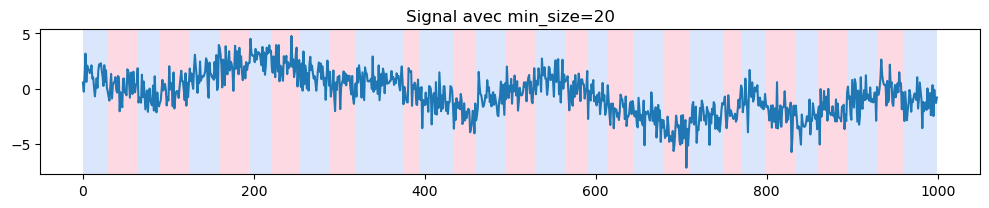

In [19]:
size=[1,10,20,40]

for i in size:
  algo = rpt.Dynp(model="l2", min_size=i).fit(signal)
  estimated_bkps = algo.predict(n_bkps=k)
  rpt.display(signal, estimated_bkps);
  plt.title(f'Signal avec min_size={i}')
  print(estimated_bkps)

(b). Que constatez-vous ?

On constate tout d'abord que l'algorithme Dynp n'a pas marché pour une valeur de min_size de 40. En effet, le paramètre min_size contrôle le nombre de points minimum à avoir entre deux ruptures. Or ici, nous avons généré un signal à 1000 observations, ainsi un minimum de 40 points entre 2 ruptures pour un total de 30 ruptures différentes nécessite au minimum 40*30 = 1200 points, ce qui est supérieur au nombre de points de notre signal.

De plus, on remarque que les positions de rupture pour les signaux avec une valeur min_size de 1, 10 et 20 sont très similaires, avec des ruptures plus rapprochés par endroit pour un min_size élevé par rapport à une valeur plus faible.

Lorsque la valeur de min_size est petite, le nombre minimal de points requis entre deux détections de ruptures est plus petit et ainsi l'algorithme est plus sensible aux fluctuations du signal, même petite. Cependant lorsque le min_size est plus élevé, l'algorithme est moins sensible à des petites fluctuations et detéctera ainsi plus des variations importantes dans le signal.

(c). Reproduire les expériences cette fois en faisant varier jump entre 2 et 10. Que constatez-vous sur les positions des ruptures estimées ?

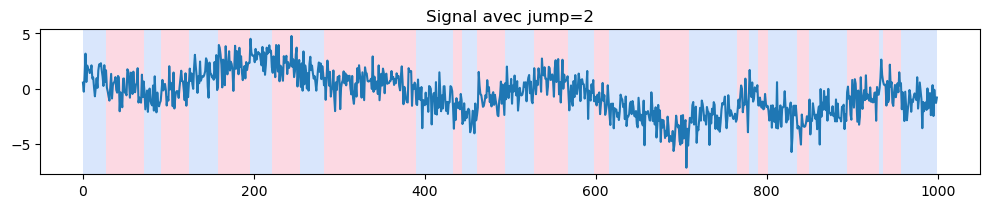

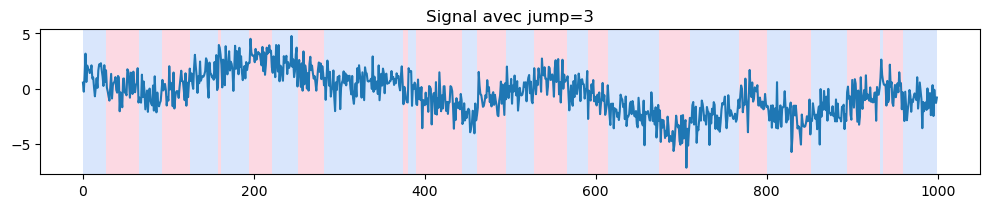

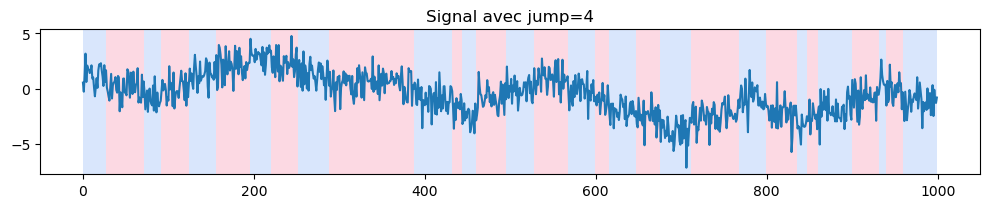

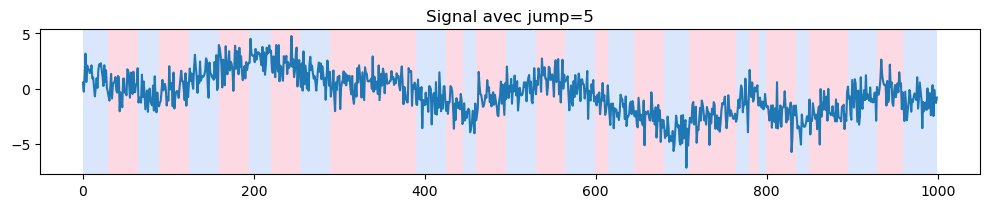

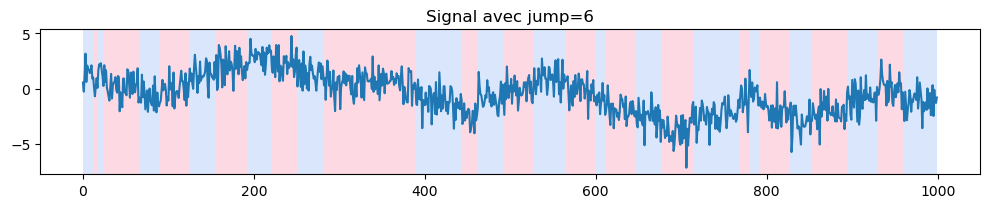

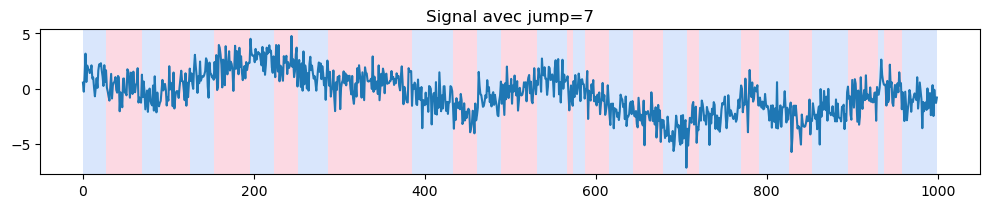

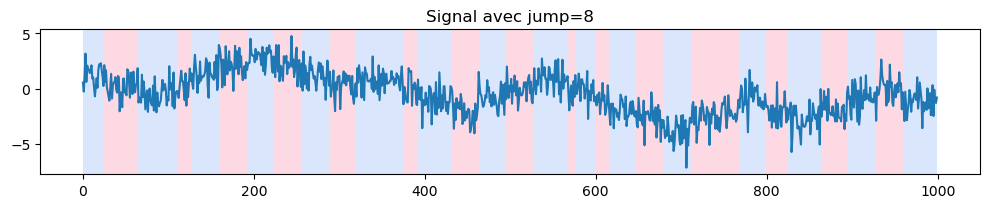

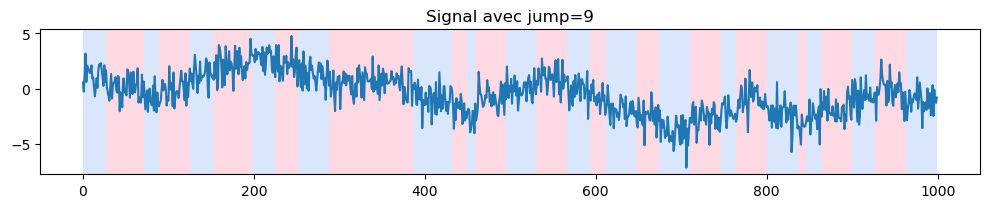

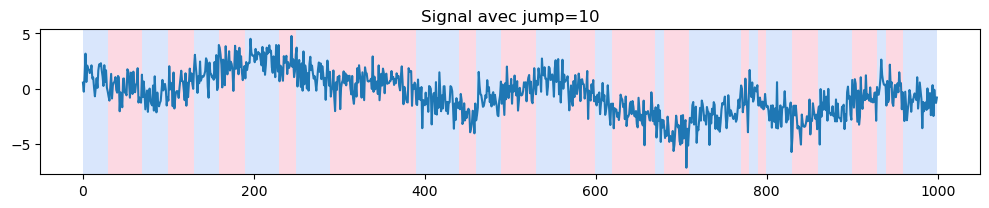

In [20]:
jump = [i for i in range(2,11)]
for i in jump:
  algo = rpt.Dynp(model="l2", jump=i).fit(signal)
  estimated_bkps = algo.predict(n_bkps=k)
  rpt.display(signal, estimated_bkps);
  plt.title(f'Signal avec jump={i}')

Le paramètre jump de la fonction Dynp contrôle la distance entre les points examinés pour la détection des ruptures. Une valeur de jump plus grande implique une réduction du nombre de points examinés, ce qui peut entraîner une diminution de la précision des ruptures et une perte de détail dans la segmentation du signal.

Les graphiques ci-dessus mettent en évidence que les positions des ruptures varient en fonction de la valeur du paramètre jump. De plus, lorsque le paramètre jump est faible, l'algorithme Dynp considère plus de points, ce qui permet une détection plus fine des ruptures, que lorsque la valeur est plus élevé. En effet, l'algorithme sautera des intervalles plus larges entre les points considérés, ce qui réduit la finesse de la détection des ruptures. Cela peut conduire à une détection moins précise des changements dans le signal et à des points de rupture plus espacés.

5. Liste des meilleures segmentations

(a). Calculer ensuite la liste des meilleures segmentations avec K = 0 jusqu’à K = 50
ruptures.

In [21]:
max_k=50
best_bkps_list = []

for k in range(max_k + 1):
    algo = rpt.Dynp(model="l2", min_size=2).fit(signal)
    estimated_bkps = algo.predict(n_bkps=k)
    best_bkps_list.append((k,estimated_bkps))

for k, best_bkps in best_bkps_list:
    print(f"K = {k}: {best_bkps}")

K = 0: [1000]
K = 1: [390, 1000]
K = 2: [375, 610, 1000]
K = 3: [375, 615, 895, 1000]
K = 4: [130, 290, 615, 895, 1000]
K = 5: [130, 270, 385, 615, 895, 1000]
K = 6: [130, 270, 390, 495, 610, 895, 1000]
K = 7: [130, 270, 390, 495, 615, 745, 895, 1000]
K = 8: [130, 270, 390, 495, 600, 675, 710, 895, 1000]
K = 9: [30, 130, 270, 390, 495, 600, 675, 710, 895, 1000]
K = 10: [30, 125, 160, 255, 390, 495, 600, 675, 710, 895, 1000]
K = 11: [30, 130, 270, 390, 495, 600, 675, 710, 765, 800, 895, 1000]
K = 12: [30, 125, 160, 255, 390, 495, 600, 675, 710, 765, 800, 895, 1000]
K = 13: [30, 125, 160, 255, 390, 495, 590, 615, 675, 710, 765, 800, 895, 1000]
K = 14: [30, 125, 160, 255, 290, 390, 495, 590, 615, 675, 710, 765, 800, 895, 1000]
K = 15: [30, 125, 160, 255, 390, 445, 460, 520, 565, 615, 675, 710, 765, 800, 895, 1000]
K = 16: [30, 125, 160, 255, 290, 390, 445, 460, 520, 565, 615, 675, 710, 765, 800, 895, 1000]
K = 17: [30, 125, 160, 255, 290, 390, 445, 460, 520, 565, 615, 675, 710, 765, 800, 

Nous obtenons la liste des meilleures segmentations grâce à la fonction Dynp, pour chaque nombre de ruptures K=0 à 50.

(b). À l’aide de la fonction costs.CostL2, calculer le coût de chacune de ces segmentations
candidates.

In [22]:
list_couts = []
for k, result in best_bkps_list:
    cost = rpt.Dynp(model="l2", min_size=2, jump=5).fit(signal).cost.sum_of_costs(result)
    list_couts.append((k, cost))

for k, couts in list_couts:
    print(f"K = {k}: {couts}")

K = 0: 3546.468803844149
K = 1: 2195.633061831625
K = 2: 1918.252728098027
K = 3: 1713.3955057529165
K = 4: 1539.9034610918663
K = 5: 1455.4626062824327
K = 6: 1354.836837070181
K = 7: 1318.0499047683277
K = 8: 1253.0116975684102
K = 9: 1216.936278201177
K = 10: 1192.9953089829257
K = 11: 1158.8610313784425
K = 12: 1134.920062160191
K = 13: 1116.1515994760682
K = 14: 1101.7670054478733
K = 15: 1085.4321128763554
K = 16: 1071.0475188481605
K = 17: 1058.691330457007
K = 18: 1044.313701286661
K = 19: 1033.9033711042682
K = 20: 1024.5540879821158
K = 21: 1016.122929458846
K = 22: 1008.4003076579827
K = 23: 999.9691491347128
K = 24: 992.3722383629568
K = 25: 986.2671702385499
K = 26: 979.7588415190908
K = 27: 973.6537733946839
K = 28: 968.8469575876138
K = 29: 962.917157115053
K = 30: 958.7630334501164
K = 31: 953.6788437549552
K = 32: 949.5247200900186
K = 33: 945.4346721014724
K = 34: 940.6227468780331
K = 35: 936.1963587413746
K = 36: 932.6309713748019
K = 37: 929.1426382442264
K = 38: 9

Ce code permet de calculer le coût total pour chaque segmentation candidate avec un nombre de ruptures K, en utilisant la fonction Dynp.

(c) Tracer un graphe représentant la performance de chacune de ces segmentations candidates en fonction du nombre de ruptures de 0 à 50. Que voyez-vous concernant la forme de la courbe ?

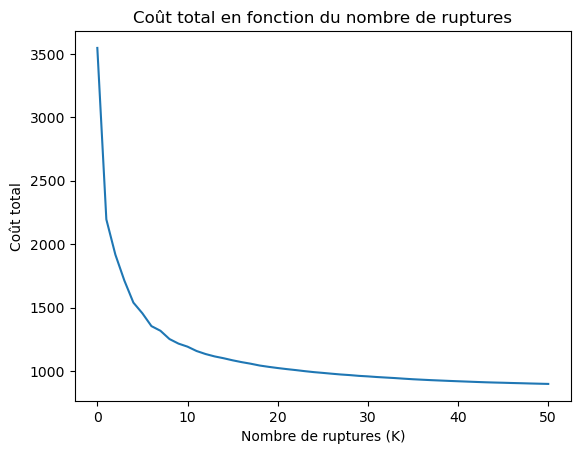

In [23]:
plt.plot([x[0] for x in list_couts], [x[1] for x in list_couts])
plt.xlabel('Nombre de ruptures (K)')
plt.ylabel('Coût total')
plt.title('Coût total en fonction du nombre de ruptures')
plt.show()

On observe que la courbe représentant le coût des segmentations en fonction du nombre de ruptures est décroissante. Initialement, la pente de la courbe est abrupte, chutant de plus de 12 000 à environ 2 000 entre 0 et 2 ruptures. Ensuite, on observe un coude décroissant, suivi par une diminution de la pente à mesure que le nombre de ruptures K augmente.

Ainsi on remarque donc que la somme des coûts diminue plus le nombre de ruptures augmente, mais semble plutôt stagner à partir de K=10, avec une diminution du coût lente.

(d) En utilisant la connaissance de la vraie moyenne du signal au cours du temps, proposer une stratégie d’évaluation de la performance de chaque segmentation candidate avec K ruptures, avec K ∈ {0, . . . , 50}. Affichez la courbe obtenue en fonction de K.

Dans la première question nous avons défini un signal à 30 ruptures, que nous connaissons. Grâce à l'algorithme Dynp, nous essayons de retrouver le nombre de rupture et leurs positions. Ainsi, il est possible d'évaluer la performance de chacune des segmentations candidates avec K ruptures proposées par Dynp par rapport à notre vrai signal.

Il existe plusieurs métrique d'évaluations différentes : le recall (ou rappel) qui mesure la proportion de ruptures correctement détectées par rapport à toutes les ruptures réelles.

$Recall= \frac{True Positives+False Negatives}{True Positives}$

De plus, il y a precision qui indique la proportion de ruptures correctement détectées par rapport à toutes les ruptures détectées par l'algorithme.
$Precision= \frac{True Positives}{True Positives+False Positives}$

Enfin il existe l'indice Rand, qui mesure la similarité entre deux signaux pour évaleur la perfomance de détection de ruptures. Pour ce faire, il calcule le nombre de paires de points dans les deux ensembles qui sont soit tous les deux dans le même segment (=vrai positif) soit tous les deux dans des segments différents (=vrai négatif).

$Rand Index= \frac{True Positives+True Negatives+False Positives+False Negatives}{True Positives+ True Negatives}$



Ces trois métriques sont déjà implémentées et nous allons donc afficher la courbe de leurs valeurs en fonction de K :

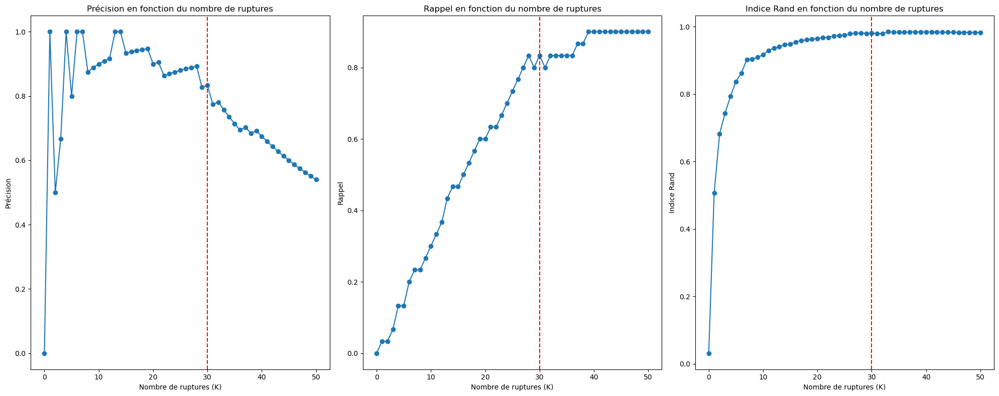

In [24]:
from ruptures.metrics import precision_recall, randindex

list_metrics=[]
rand_index=[]
for k,bkps_estimated in best_bkps_list:
    precision,recall = precision_recall(bkps,bkps_estimated)
    rand_index.append(randindex(bkps,bkps_estimated))
    list_metrics.append((precision,recall))


list_precision = [p for p, _ in list_metrics]
list_recall = [r for _, r in list_metrics]

list_k = [k for k, _ in best_bkps_list]


plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
plt.plot(list_k, list_precision, marker='o', linestyle='-')
plt.xlabel('Nombre de ruptures (K)')
plt.ylabel('Précision')
plt.title('Précision en fonction du nombre de ruptures')
plt.axvline(x=30, color='r', linestyle='--')


plt.subplot(1, 3, 2)
plt.plot(list_k, list_recall, marker='o', linestyle='-')
plt.xlabel('Nombre de ruptures (K)')
plt.ylabel('Rappel')
plt.title('Rappel en fonction du nombre de ruptures')
plt.axvline(x=30, color='r', linestyle='--')


plt.subplot(1, 3, 3)
plt.plot(list_k, rand_index, marker='o', linestyle='-')
plt.xlabel('Nombre de ruptures (K)')
plt.ylabel('Indice Rand')
plt.title('Indice Rand en fonction du nombre de ruptures')
plt.axvline(x=30, color='r', linestyle='--')


plt.tight_layout()
plt.show()


Tout d'abord on remarque que la precision débute en étant égale à 1 pour des valeurs faibles de K. Ceci s'explique logiquement par le fait que l'alogrithme n'estime qu'un petit nombre de ruptures, ce qui lui permet de localiser facilement les positions de ruptures importantes.  Puis, à fur et à mesure que K augmente, la précision fluctue puisque la probabilité de détecter que des bonnes positions de ruptures diminue car il cherche de plus en plus de ruptures faibles, plus difficile à détecter. On constate une baisse rapide de la précision pour K>30, expliquée par le fait qu'il n'y ait que 30 ruptures dans le vrai signal et donc il detecte des ruptures supplémentaires qui diminue la valeur de la précision.

De plus, on remarque que le recall ne fait qu'augmenter au fur et à mesure que K augmente. Plus l'algorithme detecte de ruptures, plus il y a de chance qu'elles soit réelles et donc le recall augmente.

Enfin, l'indice Rand augmente, jusqu'à approcher une valeur de 1 à partir de K=30 environ. Cela signifie que chaque paire de points que cette métrique évalue fait bien partie des 2 listes de ruptures (la réelle et l'estimée) et donc que notre algorithme est bien performant.

L'ensemble de ces 3 métriques nous confirment que l'algorithme Dynp détecte plutôt bien les vraies ruptures et que le nombre réel de ruptures est autour de 30.

6. Temps de calculs

 - Que dire du temps passé à calculer l’ensemble de ces segmentations candidates ?

Le temps de calcul de l'ensemble des segmentations candidates par l'algorithme Dynp est considérablement long, notamment en raison de la complexité de l'algorithme. Il recherche de manière exhaustive toutes les configurations possibles afin de trouver la meilleure. La complexité de l'algorithme augmente de manière significative, au fur et à mesure que le nombre de ruptures et la taille du signal augmentent. Ainsi en initiant une boucle de K=0 à K=50, l'algorithme est très lent.

Il est possible de réduire la complexité de l'algorithme, et donc le temps de calcul en définissant les paramètres min_size et jump, vus précédemment.

- Reproduire les étapes précédentes à l’aide de la fonction KernelCPD et l’option kernel="linear". Que constatez-vous ? Proposez une explication pour cette observation.

In [25]:
best_bkps_kernel = []

for k in range(1,max_k + 1):
  algo_kernel = rpt.KernelCPD(kernel="linear",min_size=2).fit(signal)
  estimated_bkps_kernel = algo_kernel.predict(n_bkps=k)
  best_bkps_kernel.append((k,estimated_bkps_kernel))

In [26]:
list_couts2 = []
for k, result in best_bkps_kernel:
    cost =  rpt.KernelCPD(kernel="linear").fit(signal).cost.sum_of_costs(result)
    list_couts2.append((k, cost))

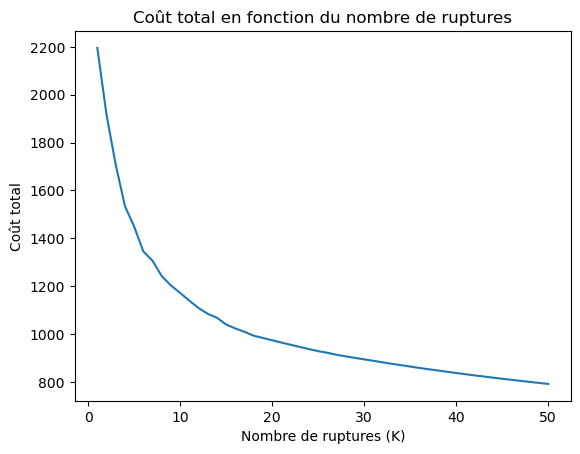

In [27]:
plt.plot([x[0] for x in list_couts2], [x[1] for x in list_couts2])
plt.xlabel('Nombre de ruptures (K)')
plt.ylabel('Coût total')
plt.title('Coût total en fonction du nombre de ruptures')
plt.show()

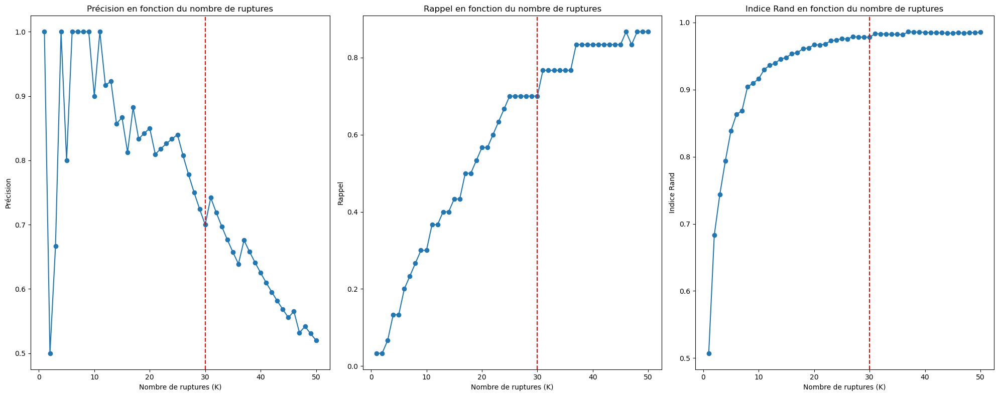

In [28]:
from ruptures.metrics import precision_recall, randindex

list_metrics=[]
rand_index=[]
for k,bkps_estimated in best_bkps_kernel:
    precision,recall = precision_recall(bkps,bkps_estimated)
    rand_index.append(randindex(bkps,bkps_estimated))
    list_metrics.append((precision,recall))


list_precision = [p for p, _ in list_metrics]
list_recall = [r for _, r in list_metrics]

list_k = [k for k, _ in best_bkps_kernel]


plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
plt.plot(list_k, list_precision, marker='o', linestyle='-')
plt.xlabel('Nombre de ruptures (K)')
plt.ylabel('Précision')
plt.title('Précision en fonction du nombre de ruptures')
plt.axvline(x=30, color='r', linestyle='--')


plt.subplot(1, 3, 2)
plt.plot(list_k, list_recall, marker='o', linestyle='-')
plt.xlabel('Nombre de ruptures (K)')
plt.ylabel('Rappel')
plt.title('Rappel en fonction du nombre de ruptures')
plt.axvline(x=30, color='r', linestyle='--')


plt.subplot(1, 3, 3)
plt.plot(list_k, rand_index, marker='o', linestyle='-')
plt.xlabel('Nombre de ruptures (K)')
plt.ylabel('Indice Rand')
plt.title('Indice Rand en fonction du nombre de ruptures')
plt.axvline(x=30, color='r', linestyle='--')


plt.tight_layout()
plt.show()

Nous avons ci-dessus répété les étapes précédentes mais en utilisant la fonction KernelCPD, qui est une classe developpé en C, plus rapide que l'algorithme Dynp developpé en python. La fonction KernelCPD contient aussi bien l'approche de programamtion dynamique que l'approche pénalisée (PELT).
Afin de pouvoir comparer les deux méthodes, nous avons utilisé la même valeur de min_size (=2). Cependant pour la valeur de jump il n'était pas possible de spécifier la même, qui devrait être égale à 1, car elle est définie implicitement pour KernelCPD et l'algorithme Dynp est bien trop lent pour une valeur aussi basse de jump.

Dans un premier temps, nous observons que la courbe représentant le coût en fonction du nombre de rupture a la même forme pour les deux approches, mais possède des valeurs très inférieures avec la fonction KernelCPD.

Dans un second temps, nous allons calculer le temps d'execution de chacune des fonctions pour un même nombre k de ruptures.

In [29]:
import time

algo_python = rpt.Dynp(model="l2").fit(signal)
algo_c = rpt.KernelCPD(kernel="linear").fit(signal)

for label, algo in zip(("Fonction Dynp (implémentation Python)", "Fonction KernelCPD (en C)"), (algo_python, algo_c)):
    start_time = time.time()
    result = algo.predict(n_bkps=30)
    print(f"{label}:\t{time.time() - start_time:.3f} s")

Fonction Dynp (implémentation Python):	1.149 s
Fonction KernelCPD (en C):	0.013 s


On observe bien que la fonction KernelCPD est bien plus rapide que Dynp, qui est donc à favoriser lorsque l'on souhaite détecter un grand nombre de ruptures dans un signal.

# Exercice 3

Après avoir chargé et mise en forme les données disponibles à l’adresse ci-dessus, utiliser un noyau linéaire pour reproduire les résultats décrits dans ces pages web.

Modifier à présent le choix du noyau reproduisant en considérant un noyau gaussien (costRBF), un noyau Cosinus (CostCosine) etc. et illustrer les résultats obtenus avec ces différents choix. Que constatez-vous ?

In [30]:
from IPython.display import Audio, display

Nous commençons par importer la musique grâce à la librairie librosa, et affichons sa fréquence sous forme de signal avec des ruptures, afin de pouvoir les detecter et définir les différentes parties au sein de la musique.

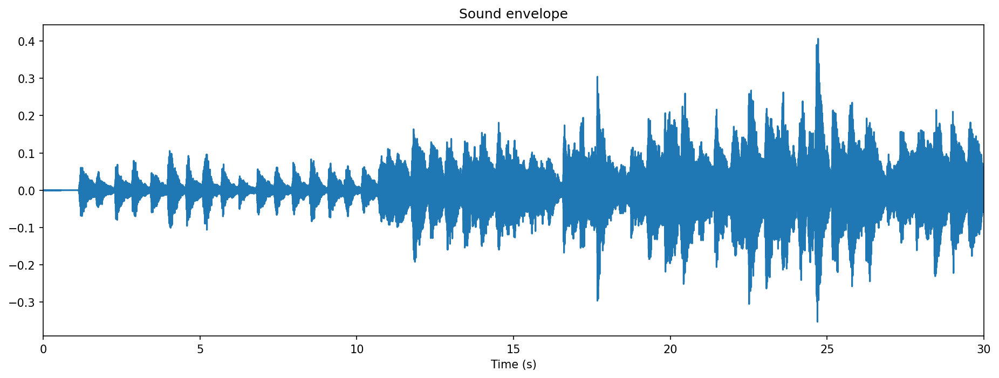

In [31]:
duration = 30  # 30 secondes
signal, sampling_rate = librosa.load(librosa.ex("nutcracker"), duration=duration)

# listen to the music
display(Audio(data=signal, rate=sampling_rate))

# look at the envelope
def fig_ax(figsize=(15, 5), dpi=150):
    """Return a (matplotlib) figure and ax objects with given size."""
    return plt.subplots(figsize=figsize, dpi=dpi)


fig, ax = fig_ax()
ax.plot(np.arange(signal.size) / sampling_rate, signal)
ax.set_xlim(0, signal.size / sampling_rate)
ax.set_xlabel("Time (s)")
_ = ax.set(title="Sound envelope")

Ensuite, nous allons afficher le tempogramme de la bande-son. Le tempogramme est un outil utilisé en traitement du signal audio pour représenter la structure rythmique d'une pièce musicale, sous la forme d'un histogramme qui montre la distribution des énergies rythmiques à différents fréquences.

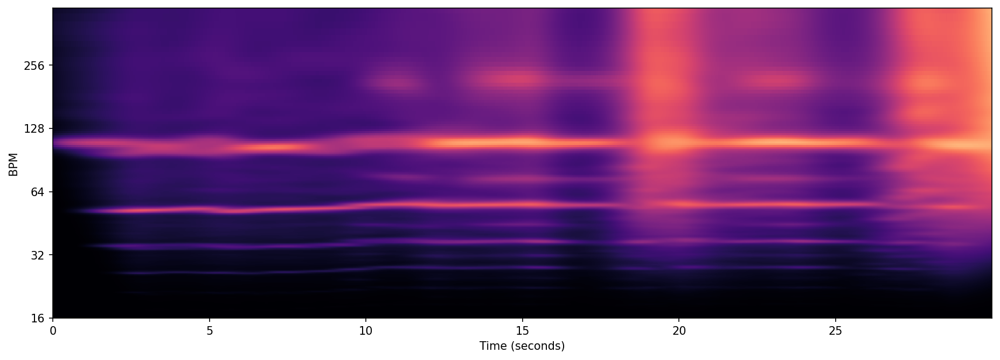

In [32]:
# Compute the onset strength
hop_length_tempo = 256
oenv = librosa.onset.onset_strength(
    y=signal, sr=sampling_rate, hop_length=hop_length_tempo
)
# Compute the tempogram
tempogram = librosa.feature.tempogram(
    onset_envelope=oenv,
    sr=sampling_rate,
    hop_length=hop_length_tempo,
)
# Display the tempogram
fig, ax = fig_ax()
_ = librosa.display.specshow(
    tempogram,
    ax=ax,
    hop_length=hop_length_tempo,
    sr=sampling_rate,
    x_axis="s",
    y_axis="tempo",
)

Désormais nous allons utiliser la fonction KernelCPD afin de repérer les ruptures de ce signal. Comme nous l'avons évoqué précédemment, cette fonction utilise une méthode basée sur un noyau afin de détecter des ruptures.
La bibliothèque ruptures offre déjà la possibilité d'utiliser trois noyaux différents qui sont prêts à être utilisés directement. Pour commencer, nous utiliserons le noyau linéaire, tel qu'illustré sur la page web. Le noyau linéaire est défini de la manière suivante :

$k_{\text{linéaire}}(u,v) = u^Tv$ , où $u$ et $v$ sont deux vecteurs de dimension $d$.

Ce premier noyau est utilisé lorsque les données présentent des relations plutôt linéaires, et est donc efficace lorsque les changements dans les données peuvent être modélisées de manière linéaire.

## Méthode 1 : Noyau linéaire

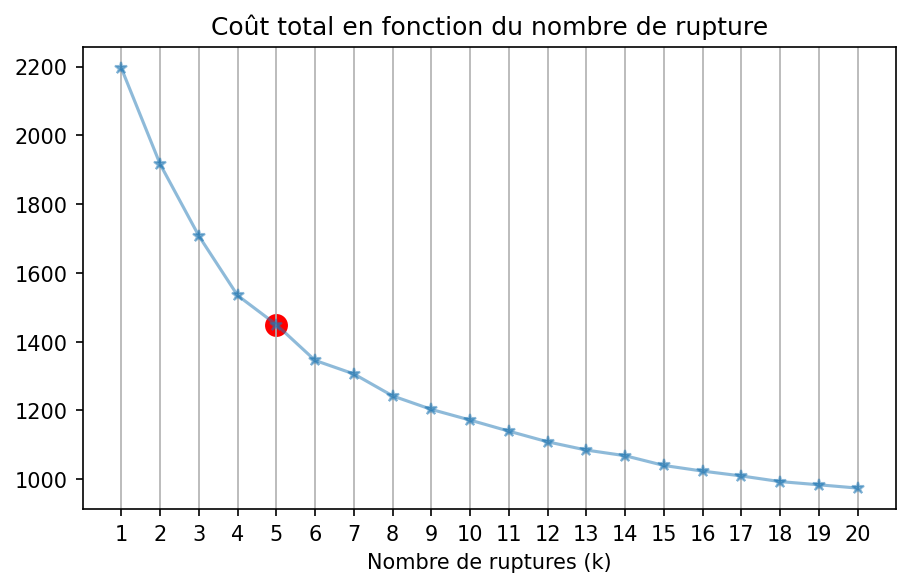

In [33]:
def cost(method):
  # Méthode de détection : Noyau linéaire
  algo = rpt.KernelCPD(kernel=method).fit(tempogram.T)

  # Nombre de changements maximum
  _ = algo.predict(n_bkps_max)
  array_of_n_bkps = np.arange(1, n_bkps_max + 1)
  return(algo,array_of_n_bkps)

# Fonction: retourne some des erreurs
def get_sum_of_cost(algo, n_bkps):
    bkps = algo.predict(n_bkps=n_bkps)
    return algo.cost.sum_of_costs(bkps)

n_bkps_max = 20
algo_linear,bkps_estimated=cost("linear")

# Représentation graphique du coût par nombre de ruptures
fig, ax = fig_ax((7, 4))
ax.plot(bkps_estimated,[get_sum_of_cost(algo=algo, n_bkps=n_bkps) for n_bkps in bkps_estimated],"-*",alpha=0.5,)
ax.set_xticks(bkps_estimated)
ax.set_xlabel("Nombre de ruptures (k)")
ax.set_title("Coût total en fonction du nombre de rupture")
ax.grid(axis="x")
ax.set_xlim(0, n_bkps_max + 1)

# Choisit 5 ruptures
n_lin = 5
_ = ax.scatter([n_lin], [get_sum_of_cost(algo=algo, n_bkps=n_lin)], color="r", s=100)

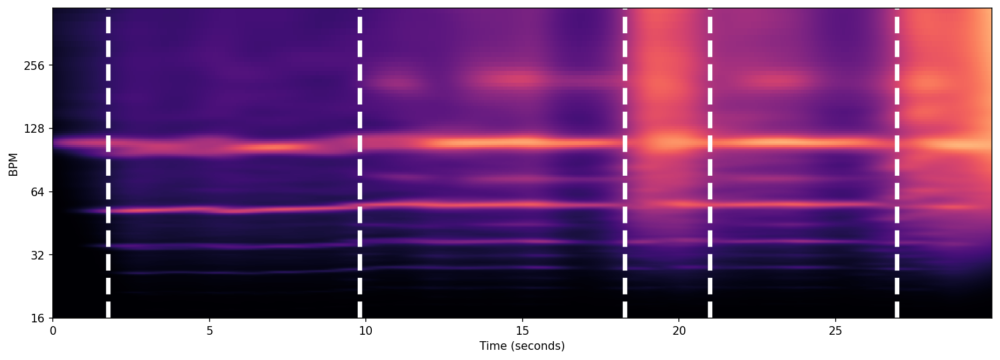

In [34]:
def segmentation(algo,n):
  # Segmentation
  bkps = algo.predict(n_bkps=n)
  # Conversion des points de rupture en temps
  bkps_times = librosa.frames_to_time(bkps, sr=sampling_rate, hop_length=hop_length_tempo)

  # Affichage de la segmentation
  fig, ax = fig_ax()
  _ = librosa.display.specshow(tempogram,ax=ax,x_axis="s",y_axis="tempo",hop_length=hop_length_tempo,sr=sampling_rate,)

  for b in bkps_times[:-1]:
    ax.axvline(b, ls="--", color="white", lw=4)
  return(bkps_times)
bkps_time=segmentation(algo_linear,n_lin)

In [35]:
def compute(time):
  # Calcul des points de changement correspondant aux indices dans le signal original
  bkps_time_indexes = (sampling_rate * time).astype(int).tolist()

  for segment_number, (start, end) in enumerate(rpt.utils.pairwise([0] + bkps_time_indexes), start=1):
    segment = signal[start:end]
    print(f"Segment n°{segment_number} (duration: {segment.size/sampling_rate:.2f} s)")
    display(Audio(data=segment, rate=sampling_rate))

compute(bkps_time)

Segment n°1 (duration: 1.76 s)


Segment n°2 (duration: 8.03 s)


Segment n°3 (duration: 8.46 s)


Segment n°4 (duration: 2.73 s)


Segment n°5 (duration: 5.97 s)


Segment n°6 (duration: 3.04 s)


## Méthode 2 : Noyau gaussien

Maintenant, nous allons répéter les étapes précédentes en utilisant le noyau gaussien, qui est défini par : $k_{\text{gaussien}}(u,v) = \exp \left( -\gamma \lVert u - v \rVert^2 \right)$

Ce noyau, contrairement au noyau linéaire, est utilisé lorsque les relations entre les données sont non linéaires et plus complexes à modéliser. Il est ainsi plus flexible que le noyau linéaire.

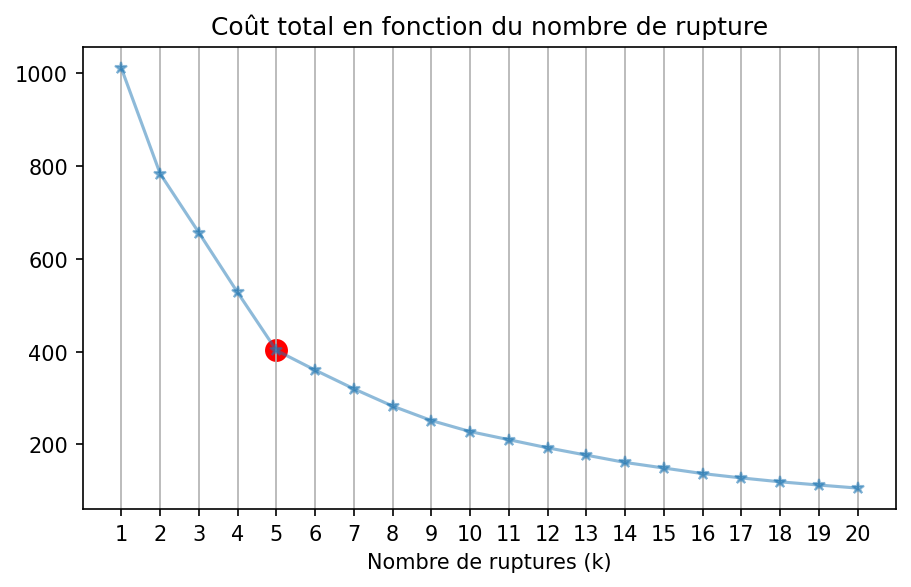

In [36]:
algo_rbf,bkps_rbf=cost("rbf")

# Représentation graphique du coût par nombre de ruptures
fig, ax = fig_ax((7, 4))
ax.plot(bkps_rbf,[get_sum_of_cost(algo=algo_rbf, n_bkps=n_bkps) for n_bkps in bkps_rbf],"-*",alpha=0.5,)
ax.set_xticks(bkps_rbf)
ax.set_xlabel("Nombre de ruptures (k)")
ax.set_title("Coût total en fonction du nombre de rupture")
ax.grid(axis="x")
ax.set_xlim(0, n_bkps_max + 1)

# Choisit 5 ruptures également
n_rbf = 5
_ = ax.scatter([n_rbf], [get_sum_of_cost(algo=algo_rbf, n_bkps=n_rbf)], color="r", s=100)

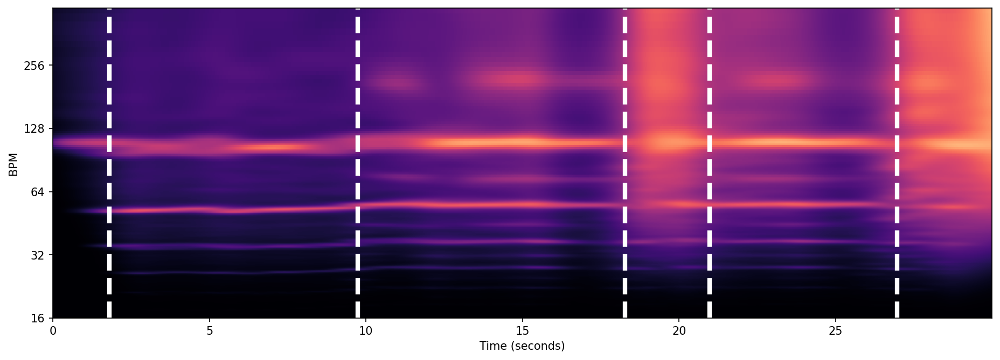

In [37]:
rbf_time=segmentation(algo_rbf,n_rbf)

In [38]:
compute(rbf_time)

Segment n°1 (duration: 1.80 s)


Segment n°2 (duration: 7.94 s)


Segment n°3 (duration: 8.52 s)


Segment n°4 (duration: 2.71 s)


Segment n°5 (duration: 5.99 s)


Segment n°6 (duration: 3.04 s)


## Méthode 3 : Noyau cosinus

Enfin, nous allons utiliser le noyau cosinus, défini comme : $k_{\text{cosinus}}(u,v) = \frac{{u^Tv}}{{\|u\|_2 \|v\|_2}}$

Ce noyau est adapté pour détecter des changements dans des séries temporelles où la magnitude des valeurs est moins importante que les tendances ou les motifs temporels. Il est ainsi utilisé avec des signaux partageant des motifs similaires, mais à des amplitudes différentes.

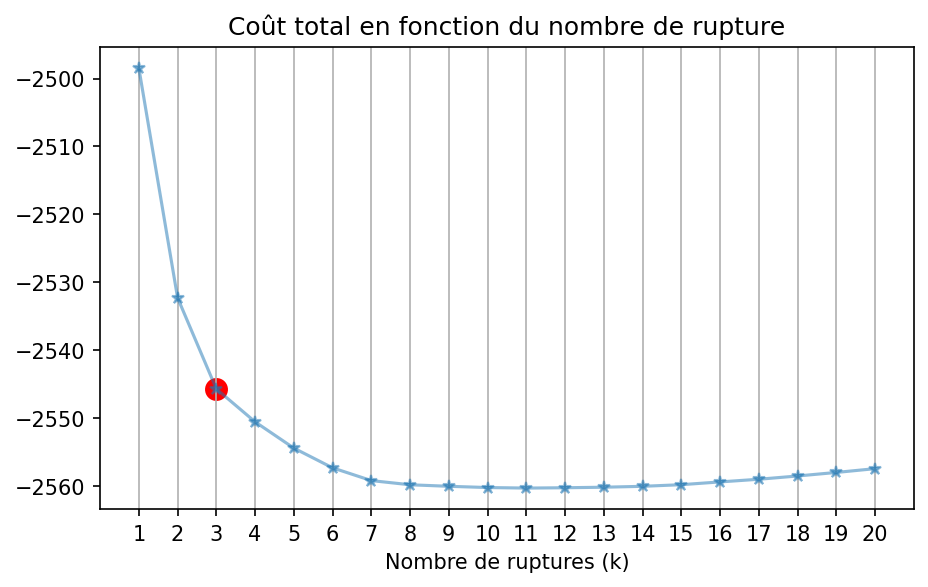

In [39]:
algo_cos,bkps_cos=cost("cosine")

# Représentation graphique du coût par nombre de ruptures
fig, ax = fig_ax((7, 4))
ax.plot(bkps_cos,[get_sum_of_cost(algo=algo_cos, n_bkps=n_bkps) for n_bkps in bkps_cos],"-*",alpha=0.5,)
ax.set_xticks(bkps_cos)
ax.set_xlabel("Nombre de ruptures (k)")
ax.set_title("Coût total en fonction du nombre de rupture")
ax.grid(axis="x")
ax.set_xlim(0, n_bkps_max + 1)

# Choisit 3 ruptures ici car c'est là ou se situe le coude de la courbe
n_cos = 3
_ = ax.scatter([n_cos], [get_sum_of_cost(algo=algo_cos, n_bkps=n_cos)], color="r", s=100)

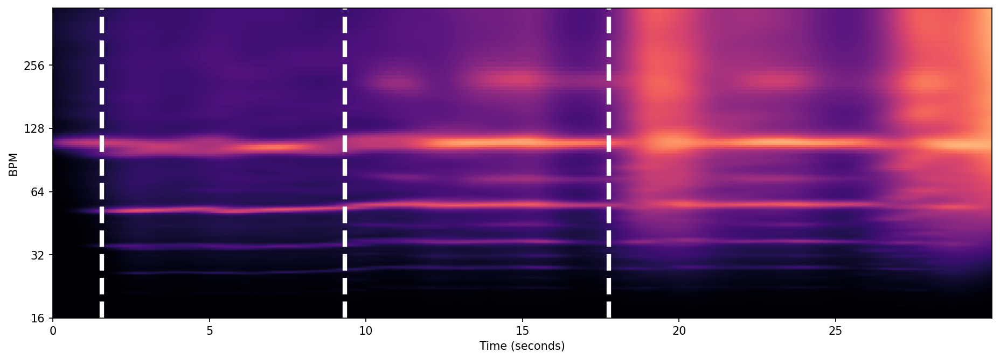

In [40]:
cos_time=segmentation(algo_cos,n_cos)

In [41]:
compute(cos_time)

Segment n°1 (duration: 1.57 s)


Segment n°2 (duration: 7.76 s)


Segment n°3 (duration: 8.43 s)


Segment n°4 (duration: 12.25 s)


Les trois noyaux fournissent des résultats plus ou moins similaires. Les fonctions de coûts sont toutes de formes convexes, mais varient tout de même en fonction du noyau choisi, car elles définissent un nombre différent de ruptures estimées.

Les résultats obtenus avec les noyaux linéaire et gaussien sont similaires, car ils ont tous deux identifié le même nombre de ruptures (5) et les 6 segmentations sont pratiquement identiques. En revanche, le noyau cosinus présente quelques différences, avec seulement 3 ruptures identifiées, entraînant ainsi des segmentations plus longues.

On conclut donc que le choix du noyau est important puisqu'il dépend du type de données sur lequel on souhaite repérer des changements de régime, et impacte donc la détection finale des ruptures.